In [1]:
import numpy as np
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib as mpl
%matplotlib inline
# Globally fix plot styling
mpl.rc('xtick', direction='out', top=True)
mpl.rc('ytick', direction='out', right=True)
mpl.rc('xtick.minor', visible=True)
mpl.rc('ytick.minor', visible=True)
import matplotlib.patheffects as PathEffects
from mpl_toolkits.axes_grid1 import make_axes_locatable
import astropy.io.fits as fits
import astropy.units as u
from time import sleep as sleep

#%cd /Users/Your/place/for/code
%matplotlib inline
from CMBAnalysis_SummerSchool import constants as cs # the constants module

from CMBAnalysis_SummerSchool.cmb_modules import * # the module of functions
from shapely.geometry import LineString
mult = 4
N = int(2**10*mult)
N_iterations = cs.N_iterations
c_min = cs.c_min
c_max = cs.c_max
X_width = cs.X_width*mult
Y_width = cs.Y_width*mult
beam_size_fwhp = cs.beam_size_fwhp

pix_size = cs.pix_size

Number_of_Sources  = cs.Number_of_Sources
Amplitude_of_Sources = cs.Amplitude_of_Sources
Number_of_Sources_EX = cs.Number_of_Sources_EX
Amplitude_of_Sources_EX = cs.Amplitude_of_Sources_EX

Number_of_SZ_Clusters  = cs.Number_of_SZ_Clusters
Mean_Amplitude_of_SZ_Clusters = cs.Mean_Amplitude_of_SZ_Clusters
SZ_beta = cs.SZ_beta
SZ_Theta_core = cs.SZ_Theta_core
beam_size_fwhp = cs.beam_size_fwhp

white_noise_level = cs.white_noise_level
atmospheric_noise_level = 0 #cs.atmospheric_noise_level
one_over_f_noise_level = 0 #cs.one_over_f_noise_level

In [2]:
%%time
def make_CMB_maps(N,pix_size,ell,DlTT,DlEE,DlTE,DlBB,random=True):
    "makes a realization of a simulated CMB sky map"

    # convert Dl to Cl, we use np.divide to avoid dividing by zero.
    dell = ell * (ell + 1) / 2 / np.pi
    ClTT = np.divide(DlTT, dell, where=ell>1)
    ClEE = np.divide(DlEE, dell, where=ell>1)
    ClTE = np.divide(DlTE, dell, where=ell>1)
    ClBB = np.divide(DlBB, dell, where=ell>1)
    
    # set the \ell = 0 and \ell =1 modes to zero as these are unmeasurmable and blow up with the above transform
    ClTT[0:2] = 0.
    ClEE[0:2] = 0.
    ClTE[0:2] = 0.
    ClBB[0:2] = 0.

    # separate the correlated and uncorrelated part of the EE spectrum
    correlated_part_of_E = np.divide(ClTE, np.sqrt(ClTT), where=ell>1)
    uncorrelated_part_of_EE = ClEE - np.divide(ClTE**2., ClTT, where=ell>1)
    
    correlated_part_of_E[0:2] = 0.
    uncorrelated_part_of_EE[0:2] = 0.
    
    # make a 2d coordinate system
    ones = np.ones(N)
    inds  = (np.arange(N) - N/2.) /(N-1.)
    X = np.outer(ones,inds)
    Y = np.transpose(X)
    R = np.sqrt(X**2. + Y**2.)
    ang = np.arctan2(Y,X)   ## we now need this angle to handle the EB <--> QU rotation
    
    # now make a set of 2d CMB masks for the T, E, and B maps
    ell_scale_factor = 2. * np.pi / (pix_size/60. * np.pi/180.)
    ell2d = R * ell_scale_factor
    ClTT_expanded = np.zeros(int(ell2d.max())+1)
    ClTT_expanded[0:(ClTT.size)] = ClTT
    ClEE_uncor_expanded = np.zeros(int(ell2d.max())+1)
    ClEE_uncor_expanded[0:(uncorrelated_part_of_EE.size)] = uncorrelated_part_of_EE
    ClE_corr_expanded = np.zeros(int(ell2d.max())+1)
    ClE_corr_expanded[0:(correlated_part_of_E.size)] = correlated_part_of_E
    ClBB_expanded = np.zeros(int(ell2d.max())+1)
    ClBB_expanded[0:(ClBB.size)] = ClBB
    CLTT2d = ClTT_expanded[ell2d.astype(int)]
    ClEE_uncor_2d = ClEE_uncor_expanded[ell2d.astype(int)]
    ClE_corr2d = ClE_corr_expanded[ell2d.astype(int)]
    CLBB2d = ClBB_expanded[ell2d.astype(int)]
    
    # now make a set of gaussian random fields that will be turned into the CMB maps
    if random==True:
        random_array_for_T = np.fft.fft2(np.random.normal(0,1,(N,N)))
        random_array_for_E = np.fft.fft2(np.random.normal(0,1,(N,N))) 
        random_array_for_B = np.fft.fft2(np.random.normal(0,1,(N,N)))
    else:
        random_array_T = pd.read_csv('random_array_for_T.csv')
        random_array_E = pd.read_csv('random_array_for_E.csv')
        random_array_B = pd.read_csv('random_array_for_B.csv')
        random_array_for_T = []
        random_array_for_E = []
        random_array_for_B = []
        for i,x in enumerate(random_array_T.iloc[:N]):
            random_array_for_T.append(list(x)[:N])
            random_array_for_E.append(list(random_array_E[i].iloc[:N]))
            random_array_for_B.append(list(random_array_B[i].iloc[:N]))
    
    ## make the T, E, and B maps by multiplying the masks against the random fields
    FT_2d = np.sqrt(CLTT2d) * random_array_for_T
    FE_2d = np.sqrt(ClEE_uncor_2d) * random_array_for_E + ClE_corr2d* random_array_for_T
    FB_2d = np.sqrt(CLBB2d) * random_array_for_B
    
    ## now conver E abd B to Q and U
    FQ_2d = FE_2d* np.cos(2.*ang) - FB_2d * np.sin(2. *ang)
    FU_2d = FE_2d* np.sin(2.*ang) + FB_2d * np.cos(2. *ang)
    
    ## convert from fourier space to real space
    CMB_T = np.fft.ifft2(np.fft.fftshift(FT_2d)) /(pix_size /60.* np.pi/180.)
    CMB_T = np.real(CMB_T)
    CMB_T = CMB_T-np.mean(CMB_T)
    CMB_Q = np.fft.ifft2(np.fft.fftshift(FQ_2d)) /(pix_size /60.* np.pi/180.)
    CMB_Q = np.real(CMB_Q)
    CMB_Q = CMB_Q-np.mean(CMB_Q)
    CMB_U = np.fft.ifft2(np.fft.fftshift(FU_2d)) /(pix_size /60.* np.pi/180.)
    CMB_U = np.real(CMB_U)
    CMB_U = CMB_U-np.mean(CMB_U)

    ## optional code for spitting out E and B maps 
    CMB_E = np.fft.ifft2(np.fft.fftshift(FE_2d)) /(pix_size /60.* np.pi/180.)
    CMB_E = np.real(CMB_E)
    CMB_E = CMB_E-np.mean(CMB_E)
    CMB_B = np.fft.ifft2(np.fft.fftshift(FB_2d)) /(pix_size /60.* np.pi/180.)
    CMB_B = np.real(CMB_B)
    CMB_B = CMB_B-np.mean(CMB_B)
    
    ## return the maps
    return(CMB_T,CMB_Q,CMB_U,CMB_E,CMB_B)
  ###############################
def Plot_CMB_Map(Map_to_Plot,c_min,c_max,X_width,Y_width,ax,color_scale=False):
#     print(f"map{iteration+1} mean: {np.mean(Map_to_Plot)} and rms: {np.std(Map_to_Plot)}")
    im = ax.imshow(Map_to_Plot, interpolation='bilinear',origin='lower',aspect='auto',cmap=cm.gnuplot2)#RdBu_r)
    im.set_extent([0,X_width,0,Y_width])
    if color_scale==True:
        im.set_clim(c_min,c_max)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = fig.colorbar(im, cax=cax)
    ax.set_ylabel('angle $[^\circ]$')#,fontsize=30)
    ax.set_xlabel('angle $[^\circ]$')#,fontsize=30)
    cbar.set_label(r'temperature [$\mu$K]',rotation=270,ha='center',va='center')#,fontsize=30)
    return
  ###############################
def R(mat1,mat2,theta):
    theta = np.deg2rad(theta)
    Qp = np.cos(2*theta)*mat1-np.sin(2*theta)*mat2
    Up = np.sin(2*theta)*mat1+np.cos(2*theta)*mat2
    return Qp,Up
  ###############################
def convolution(Map1,Map2):
    FFT1 = np.fft.fft2(Map1)
    FFT2 = np.fft.fft2(np.fft.fftshift(Map2))
    Convolved_Map = np.real(np.fft.ifft2((FFT1*FFT2)))
    return Convolved_Map
  ###############################
def make_noise_map(N,pix_size,white_noise_level,atmospheric_noise_level,one_over_f_noise_level):
    "makes a realization of instrument noise, atmosphere and 1/f noise level set at 1 degrees"
    ## make a white noise map
    white_noise = np.random.normal(0,1,(N,N)) * white_noise_level/pix_size
 
    ## make an atnosperhic noise map
    atmospheric_noise = 0.
    if (atmospheric_noise_level != 0):
        ones = np.ones(N)
        inds  = (np.arange(N)+.5 - N/2.) 
        X = np.outer(ones,inds)
        Y = np.transpose(X)
        R = np.sqrt(X**2. + Y**2.) * pix_size /60. ## angles relative to 1 degrees  
        mag_k = 2 * np.pi/(R+.01)  ## 0.01 is a regularization factor
        atmospheric_noise = np.fft.fft2(np.random.normal(0,1,(N,N)))
        atmospheric_noise  = np.fft.ifft2(atmospheric_noise * np.fft.fftshift(mag_k**(5/3.)))
        atmospheric_noise = atmospheric_noise * atmospheric_noise_level/pix_size

    ## make a 1/f map, along a single direction to illustrate striping 
    oneoverf_noise = 0.
    if (one_over_f_noise_level != 0): 
        ones = np.ones(N)
        inds  = (np.arange(N)+.5 - N/2.) 
        X = np.outer(ones,inds) * pix_size /60. ## angles relative to 1 degrees 
        kx = 2 * np.pi/(X+.01) ## 0.01 is a regularization factor
        oneoverf_noise = np.fft.fft2(np.random.normal(0,1,(N,N)))
        oneoverf_noise = np.fft.ifft2(oneoverf_noise * np.fft.fftshift(kx))* one_over_f_noise_level/pix_size

    ## return the noise map
    noise_map = np.real(white_noise + atmospheric_noise + oneoverf_noise)
    return(noise_map)
  ###############################
def makeGaussian(N,pix_size,fwhm=3,center=None):
    x = np.arange(0, N, 1, float)
    y = x[:,np.newaxis]

    if center is None:
        x0 = y0 = N // 2
    else:
        x0 = center[0]/(pix_size/60)
        y0 = center[1]/(pix_size/60)
    Gaussian = np.exp(-4*np.log(2) * ((x-x0)**2 + (y-y0)**2) / (fwhm/(pix_size/60))**2)
    Gaussian = Gaussian / np.sum(Gaussian)
    return Gaussian
  ###############################
def minim_polarization(Qa,Ua,Qb,Ub,num=181,span=90):
#   minim_polarization(SAT_Q,SAT_U,SPLAT_Q,SPLAT_U)
    chi2 = np.array([])
    thetas = np.linspace(-span,span,num)
    for j,theta in enumerate(thetas):
        Q2,U2 = R(Qb,Ub,theta)
        chi2 = np.append(chi2,np.sum(((Q2-Qa)**2+(U2-Ua)**2)))
    mini = np.amin(chi2)
    thetamin = np.where(chi2==np.min(chi2))
    return chi2,thetas,thetas[thetamin][0]


Wall time: 0 ns


In [3]:
%%time
nbig = 10000
# read in the input CMB spectra
ell, DlTT,DlEE,DlBB, DlTE= np.loadtxt("CMBAnalysis_SummerSchool/CMB_fiducial_totalCls.dat", usecols=(0, 1,2,3,4), unpack=True) 

##
ell_big = np.arange(nbig)
DlTT_big = np.zeros(nbig)
DlTT_big[ell.astype(int)] = DlTT
DlEE_big = np.zeros(nbig)
DlEE_big[ell.astype(int)] = DlEE
DlBB_big = np.zeros(nbig)
DlBB_big[ell.astype(int)] = DlBB
DlTE_big = np.zeros(nbig)
DlTE_big[ell.astype(int)] = DlTE

ell = ell_big
DlTT = DlTT_big + 1e-3   ### the 1e-3 factor maps plotting easy
DlEE = DlEE_big + 1e-3
DlBB = DlBB_big + 1e-3
DlTE = DlTE_big

Temp_point_source_spectrum = DlTT[3000]*(ell/3000.)**2.
Pol_point_source_spectrum = DlEE[4500]*(ell/4500.)**2.

DlTT_PS = DlTT + Temp_point_source_spectrum   ### these are used for computing the transer functions
DlEE_PS = DlEE + Pol_point_source_spectrum
DlBB_PS = DlBB + Pol_point_source_spectrum

Wall time: 54.9 ms


Wall time: 21 s


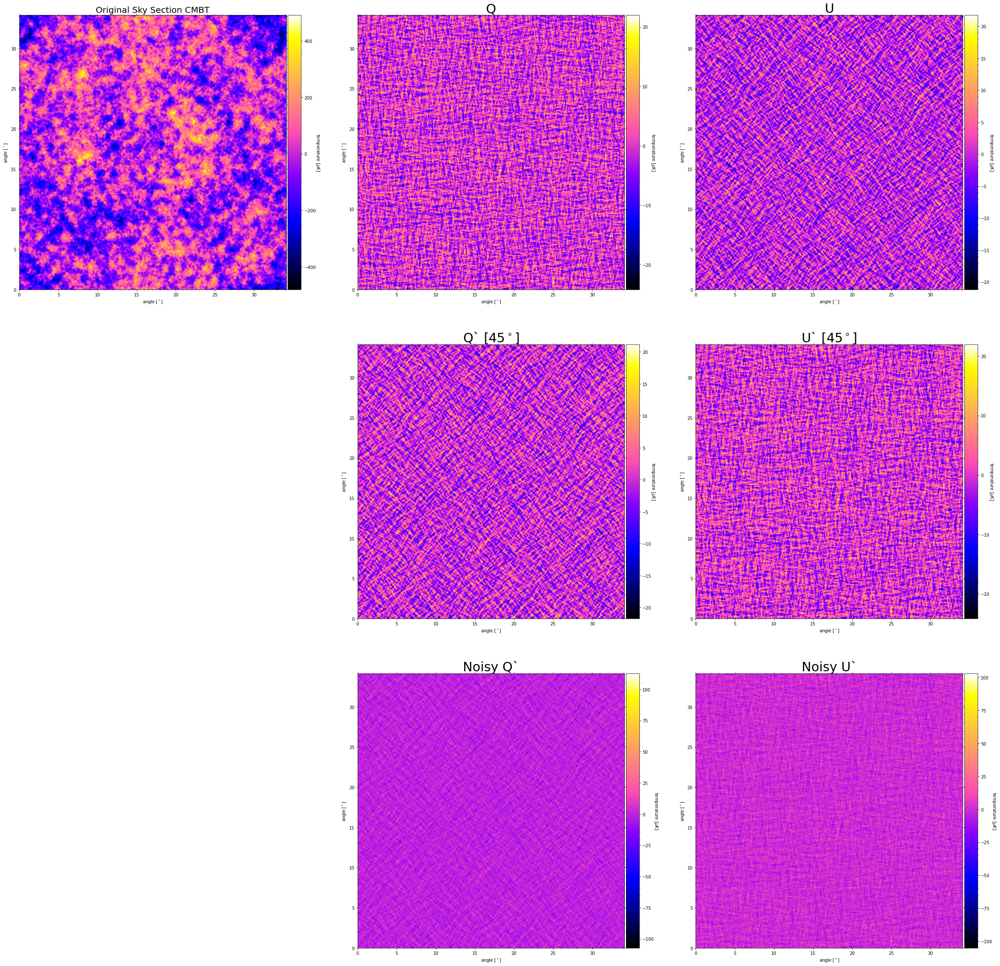

In [4]:
%%time
CMB_T,CMB_Q,CMB_U,CMB_E,CMB_B = make_CMB_maps(N,pix_size,ell,DlTT,DlEE,DlTE,DlBB)

fig = plt.figure(figsize=(40,40)) #for (2x5)->(30,10),(2x6)->(27,9)
fig.patch.set_facecolor('white')
ax = fig.add_subplot(3,3,1)
ax.set_title('Original Sky Section CMBT',fontsize=20)
Plot_CMB_Map(CMB_T,c_min,c_max,X_width,Y_width,ax)

ax = fig.add_subplot(3,3,2)
ax.set_title('Q',fontsize=30)
Plot_CMB_Map(CMB_Q,c_min/20,c_max/20,X_width,Y_width,ax)

ax = fig.add_subplot(3,3,3)
ax.set_title('U',fontsize=30)
Plot_CMB_Map(CMB_U,c_min/20,c_max/20,X_width,Y_width,ax)

# PA = np.array([CMB_Q,CMB_U])
theta = 45
Qp,Up = R(CMB_Q,CMB_U,theta)


ax = fig.add_subplot(3,3,5)
ax.set_title('Q` '+f'[{theta}'+'$^\circ$]',fontsize=30)
Plot_CMB_Map(Qp,c_min/20,c_max/20,X_width,Y_width,ax)

ax = fig.add_subplot(3,3,6)
ax.set_title('U` '+f'[{theta}'+'$^\circ$]',fontsize=30)
Plot_CMB_Map(Up,c_min/20,c_max/20,X_width,Y_width,ax)


white_noise = np.random.normal(0,1,(N,N)) * white_noise_level/pix_size
PB = np.array([Qp+white_noise,Up+white_noise])

ax = fig.add_subplot(3,3,8)
ax.set_title('Noisy Q`',fontsize=30)
Plot_CMB_Map(PB[0],c_min/20,c_max/20,X_width,Y_width,ax)

ax = fig.add_subplot(3,3,9)
ax.set_title('Noisy U`',fontsize=30)
Plot_CMB_Map(PB[1],c_min/20,c_max/20,X_width,Y_width,ax)

Wall time: 1.52 s


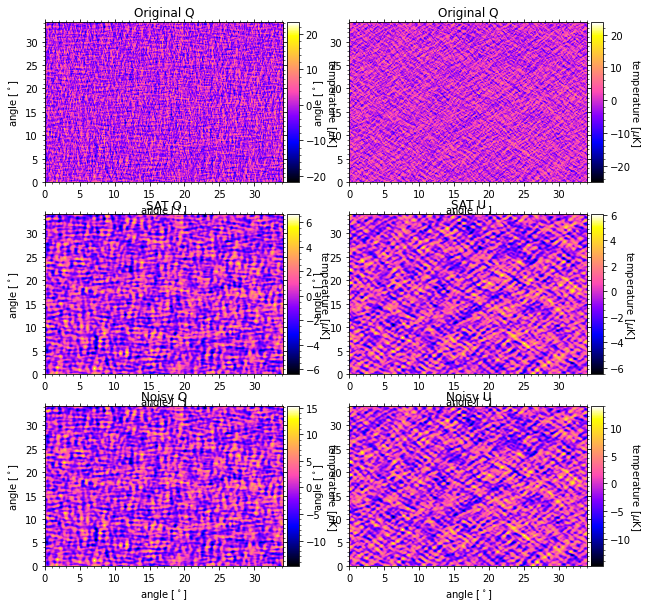

In [9]:
%%time
fig = plt.figure(figsize=(10,10)) #for (2x5)->(30,10),(2x6)->(27,9)
fig.patch.set_facecolor('white')

ax = fig.add_subplot(3,2,1)
ax.set_title('Original Q')
Plot_CMB_Map(CMB_Q,c_min/20,c_max/20,X_width,Y_width,ax,color_scale=False)

ax = fig.add_subplot(3,2,2)
ax.set_title('Original Q')
Plot_CMB_Map(CMB_U,c_min/20,c_max/20,X_width,Y_width,ax,color_scale=False)

ax = fig.add_subplot(3,2,1+2)
ax.set_title('SAT Q')
Plot_CMB_Map(SAT_Q,c_min/20,c_max/20,X_width,Y_width,ax,color_scale=False)

ax = fig.add_subplot(3,2,2+2)
ax.set_title('SAT U')
Plot_CMB_Map(SAT_U,c_min/20,c_max/20,X_width,Y_width,ax,color_scale=False)

ax = fig.add_subplot(3,2,3+2)
ax.set_title('Noisy Q')
Plot_CMB_Map(SAT_N_Q*2.3,c_min/20,c_max/20,X_width,Y_width,ax,color_scale=False)

ax = fig.add_subplot(3,2,4+2)
ax.set_title('Noisy U')
Plot_CMB_Map(SAT_N_U*2.3,c_min/20,c_max/20,X_width,Y_width,ax,color_scale=False)

In [5]:
%%time
SAT_fwhm = (23*u.arcmin).to('deg').value
SPLAT_fwhm = (1.6*u.arcmin).to('deg').value
CMB_T,CMB_Q,CMB_U,CMB_E,CMB_B = make_CMB_maps(N,pix_size,ell,DlTT,DlEE,DlTE,DlBB)

SAT_beam = makeGaussian(N,pix_size,fwhm=SAT_fwhm)
SPLAT_beam = makeGaussian(N,pix_size,fwhm=SPLAT_fwhm)

SAT_Q = convolution(CMB_Q,SAT_beam)
SAT_U = convolution(CMB_U,SAT_beam)
                 
SPLAT_Q = convolution(CMB_Q,SPLAT_beam)
SPLAT_U = convolution(CMB_U,SPLAT_beam)
                 

iterations = 200
colors = cm.rainbow(np.linspace(0, 1, iterations))
sides = round(np.sqrt(iterations))

fig2 = plt.figure(figsize=((sides+1)*10,(sides)*10))

minimums = []
for i in range(iterations):
    SAT_Q_Noise = np.random.normal(0,1,(N,N)) * (1*1)/pix_size #make_noise_map(N,pix_size,1.0,0,0)
    SAT_Q_Noise = convolution(SAT_Q_Noise,SAT_beam)
#     SAT_Q_Noise = SAT_Q_Noise*(1/60)/(np.std(SAT_Q_Noise))
    SAT_U_Noise = np.random.normal(0,1,(N,N)) * (1*1)/pix_size
    SAT_U_Noise = convolution(SAT_U_Noise,SAT_beam)
#     SAT_U_Noise = SAT_U_Noise*(1/60)/(np.std(SAT_U_Noise))
    SPLAT_Q_Noise = np.random.normal(0,1,(N,N)) * (1.6*1)/pix_size #make_noise_map(N,pix_size,1.6,0,0)
    SPLAT_Q_Noise = convolution(SPLAT_Q_Noise,SPLAT_beam)
#     SPLAT_Q_Noise = SPLAT_Q_Noise*(1/2)/(np.std(SPLAT_Q_Noise))
    SPLAT_U_Noise = np.random.normal(0,1,(N,N)) * (1.6*1)/pix_size
    SPLAT_U_Noise = convolution(SPLAT_U_Noise,SPLAT_beam)
#     SPLAT_U_Noise = SPLAT_U_Noise*(1/2)/(np.std(SPLAT_U_Noise))
    
    SAT_N_Q = SAT_Q + SAT_Q_Noise
    SAT_N_U = SAT_U + SAT_U_Noise
    SPLAT_N_Q = SPLAT_Q + SPLAT_Q_Noise
    SPLAT_N_U = SPLAT_U + SPLAT_U_Noise 
    chi2,thetas,minimum = minim_polarization(SAT_N_Q,SAT_N_U,SPLAT_N_Q,SPLAT_N_U,37,span=.2)
    
    ax2 = fig2.add_subplot(sides,sides+1,i+1)
    ax2.scatter(thetas,chi2,s=20,marker='o',
               facecolors=colors[i],edgecolors='k')
    ax2.set_ylabel('\u03C7'+r'$_2$');
    ax2.set_xlabel(r'Angle [$^{\circ}$]');
    ax2.set_facecolor('lightgray');
    ax2.grid(which='both',color='darkgray');
    minimums.append(minimum)
    print(f"{(i+1)/iterations*100:.2f}%",end='\r')
# hist,edges,obj = plt.hist(minimums,bins=len(set(minimums)),edgecolor='w')
# bincent=(0.5*(edges[1:]+edges[:-1]))
# count, _ = np.histogram(minimums, edges)
# for i,x in enumerate(count):
#     if x>0:
#         if i%2==0:
#             txt = plt.text(bincent[i],hist[i]*1.1,x,ha='center',
#                      c='b',fontsize=10,rotation=0)
#         else:
#             txt = plt.text(bincent[i],hist[i]*1.1,x,ha='center',
#                      c='r',fontsize=10,rotation=0)
#         txt.set_path_effects([PathEffects.withStroke(linewidth=.9, foreground='w')])
        
# obj_arr = np.linspace(0,len(obj)-1,len(obj),dtype=int)
# for i,x in enumerate(obj_arr[::2]):
#     obj[x].set_facecolor('b')
#     if x<obj_arr[-1]:
#         obj[x+1].set_facecolor('r')
# plt.semilogy();

Wall time: 2h 3min 7s


Wall time: 73.8 ms


[]

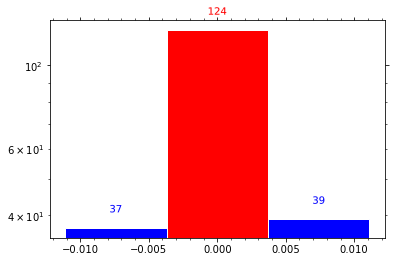

In [6]:
%%time
hist,edges,obj = plt.hist(minimums,bins=len(set(minimums)),edgecolor='w')
bincent=(0.5*(edges[1:]+edges[:-1]))
count, _ = np.histogram(minimums, edges)
for i,x in enumerate(count):
    if x>0:
        if i%2==0:
            txt = plt.text(bincent[i],hist[i]*1.1,x,ha='center',
                     c='b',fontsize=10,rotation=0)
        else:
            txt = plt.text(bincent[i],hist[i]*1.1,x,ha='center',
                     c='r',fontsize=10,rotation=0)
        txt.set_path_effects([PathEffects.withStroke(linewidth=.9, foreground='w')])
        
obj_arr = np.linspace(0,len(obj)-1,len(obj),dtype=int)
for i,x in enumerate(obj_arr[::2]):
    obj[x].set_facecolor('b')
    if x<obj_arr[-1]:
        obj[x+1].set_facecolor('r')
plt.semilogy();
# minimums

Wall time: 1h 11min 49s


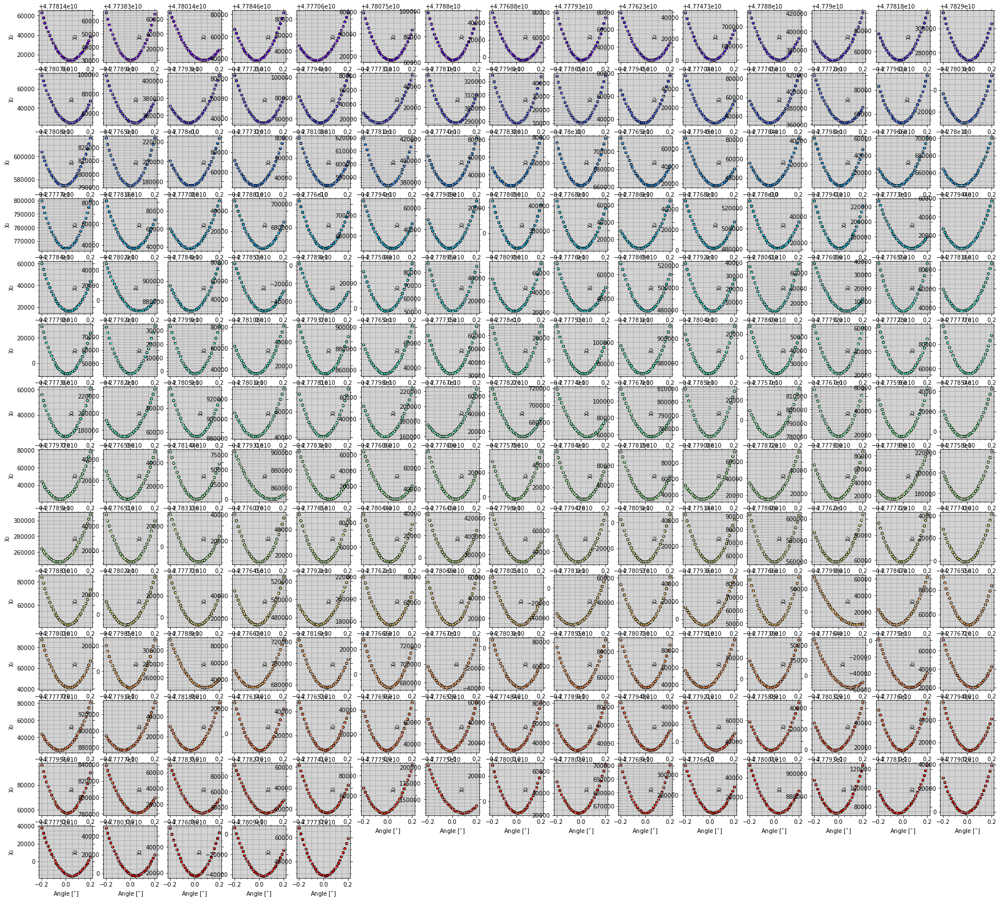

In [80]:
%%time
SAT_fwhm = (23*u.arcmin).to('deg').value
SPLAT_fwhm = (1.6*u.arcmin).to('deg').value
CMB_T,CMB_Q,CMB_U,CMB_E,CMB_B = make_CMB_maps(N,pix_size,ell,DlTT,DlEE,DlTE,DlBB)

SAT_Q = convolution(CMB_Q,makeGaussian(N,fwhm=SAT_fwhm))
SAT_U = convolution(CMB_U,makeGaussian(N,fwhm=SAT_fwhm))
                 
SPLAT_Q = convolution(CMB_Q,makeGaussian(N,fwhm=SPLAT_fwhm))
SPLAT_U = convolution(CMB_U,makeGaussian(N,fwhm=SPLAT_fwhm))
                 
atmospheric_noise_level = 0.1  # multiply by zero to turn this off
one_over_f_noise_level = 0.2 # multiply by zero to turn this off

iterations = 200
colors = cm.rainbow(np.linspace(0, 1, iterations))
sides = round(np.sqrt(iterations))

fig2 = plt.figure(figsize=((sides+1)*2,(sides)*2))


minimums2 = []
for i in range(iterations):
    SAT_Noise = np.random.normal(0,1,(N,N)) * (1*10)/pix_size #make_noise_map(N,pix_size,1.0,0,0)
    SPLAT_Noise = np.random.normal(0,1,(N,N)) * (1.6*10)/pix_size #make_noise_map(N,pix_size,1.6,0,0)
    SAT_N_Q = SAT_Q + SAT_Noise
    SAT_N_U = SAT_U + SAT_Noise
    SPLAT_N_Q = SPLAT_Q + SPLAT_Noise
    SPLAT_N_U = SPLAT_U + SPLAT_Noise 
    chi2,thetas,minimum = minim_polarization(SAT_N_Q,SAT_N_U,SPLAT_N_Q,SPLAT_N_U,31,span=.2)
    
    ax2 = fig2.add_subplot(sides,sides+1,i+1)
    ax2.scatter(thetas,chi2,s=20,marker='o',
               facecolors=colors[i],edgecolors='k')
    ax2.set_ylabel('\u03C7'+r'$_2$');
    ax2.set_xlabel(r'Angle [$^{\circ}$]');
    ax2.set_facecolor('lightgray');
    ax2.grid(which='both',color='darkgray');
    minimums2.append(minimum)
    print(f"{(i+1)/iterations*100:.2f}%",end='\r')

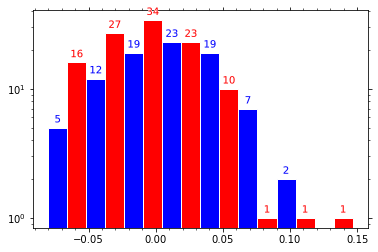

In [83]:
hist,edges,obj = plt.hist(minimums2,bins=len(set(minimums2)),edgecolor='w')
bincent=(0.5*(edges[1:]+edges[:-1]))
count, _ = np.histogram(minimums2, edges)
for i,x in enumerate(count):
    if x>0:
        if i%2==0:
            txt = plt.text(bincent[i],hist[i]*1.1,x,ha='center',
                     c='b',fontsize=10,rotation=0)
        else:
            txt = plt.text(bincent[i],hist[i]*1.1,x,ha='center',
                     c='r',fontsize=10,rotation=0)
        txt.set_path_effects([PathEffects.withStroke(linewidth=.9, foreground='w')])
        
obj_arr = np.linspace(0,len(obj)-1,len(obj),dtype=int)
for i,x in enumerate(obj_arr[::2]):
    obj[x].set_facecolor('b')
    if x<obj_arr[-1]:
        obj[x+1].set_facecolor('r')
plt.semilogy();

Wall time: 3min 52s


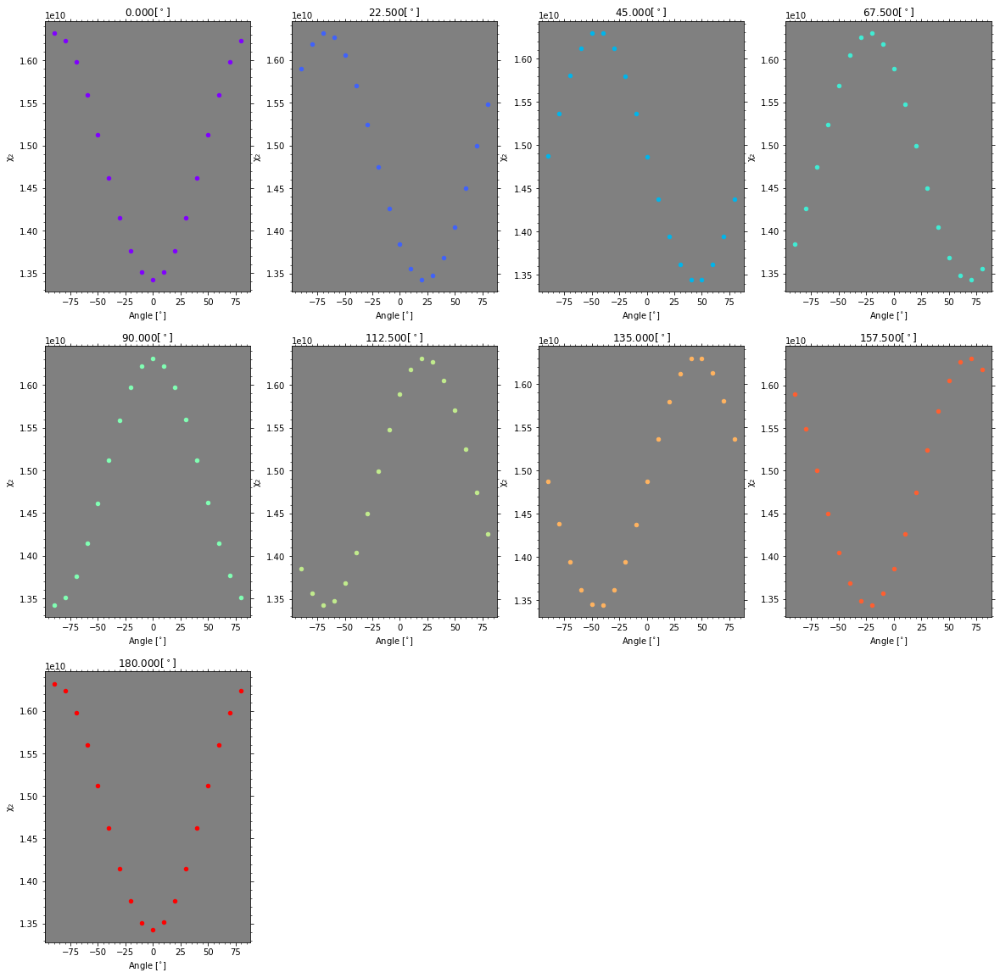

In [37]:
%%time
theta = np.linspace(0,180,9)
colors = cm.rainbow(np.linspace(0, 1, int(len(theta))))

fig2 = plt.figure(figsize=(20,20))
sides = round(np.sqrt(len(theta)))
# allmin = {}
for j,thet in enumerate(theta):
    Qrot,Urot = R(CMB_Q,CMB_U,thet)
    Qa = Qrot+white_noise
    Ua = Urot+white_noise
    ax2 = fig2.add_subplot(sides+1,sides,j+1)
    ax2.set_title(f'{thet:.3f}'+'$[^\circ]$')
    chi2,thetas,minimum = minim_polarization(Qa,Ua,CMB_Q,CMB_U,step=10)
    ax2.scatter(thetas,chi2,color=colors[j],s=20)
    ax2.set_facecolor('light-gray')
    ax2.set_ylabel('\u03C7'+r'$_2$');
    ax2.set_xlabel(r'Angle [$^{\circ}$]');
#     for k,thet2 in enumerate(theta):
#         Qb,Ub = R(CMB_Q,CMB_U,thet2) 
#         mini = np.sum(((Qb-Qa)**2+(Ub-Ua)**2))
#         ax2.scatter(thet2,mini,color=colors[j],s=3)
    print(f'{((j+1)/len(theta))*100:.3f}%',end='\r')